In [5]:
!pip install torchmetrics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 50.1 MB/s eta 0:00:00


In [ ]:


import os, cv2, tqdm, random, numpy as np
from glob import glob
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torchmetrics
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cpu


In [ ]:


from pycocotools.coco import COCO
import numpy as np
import cv2
from PIL import Image
import os, tqdm

RAW_IMG_DIR = "/content/train_subset/train2017"
ANNOT_PATH  = "/content/annotations/annotations/instances_train2017.json"


PROC_DIR = "/content/processed"
IMG_DIR  = f"{PROC_DIR}/images"
MASK_DIR = f"{PROC_DIR}/masks"
BIN_DIR  = f"{PROC_DIR}/binary_masks"

!rm -rf /content/processed
os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(MASK_DIR, exist_ok=True)
os.makedirs(BIN_DIR, exist_ok=True)

coco = COCO(ANNOT_PATH)
img_ids = coco.getImgIds()

IMG_SIZE = 256
MAX_IMAGES = 40000     # your requirement

print("Regenerating CLEAN dataset for 40,000 images...")
saved = 0

for img_id in tqdm.tqdm(img_ids[:MAX_IMAGES]):
    info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(RAW_IMG_DIR, info["file_name"])
    if not os.path.exists(img_path):
        continue

    # load and resize image
    img = np.array(Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE)))

    # load annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    if len(anns) == 0:
        continue

    # build mask
    mask = np.zeros((IMG_SIZE, IMG_SIZE), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        m = cv2.resize(m, (IMG_SIZE, IMG_SIZE))
        mask = np.maximum(mask, m)

    # ignore empty masks
    if mask.sum() < 50:
        continue

    name = info["file_name"].replace(".jpg", "")

    Image.fromarray(img).save(f"{IMG_DIR}/{name}.jpg")
    Image.fromarray(mask * 255).save(f"{MASK_DIR}/{name}.png")
    Image.fromarray((mask > 0).astype(np.uint8) * 255).save(f"{BIN_DIR}/{name}.png")

    saved += 1

print("Final saved:", saved)


loading annotations into memory...
Done (t=16.92s)
creating index...
index created!
Regenerating CLEAN dataset for 40,000 images...


100%|██████████| 40000/40000 [14:05<00:00, 47.29it/s]

Final saved: 39605


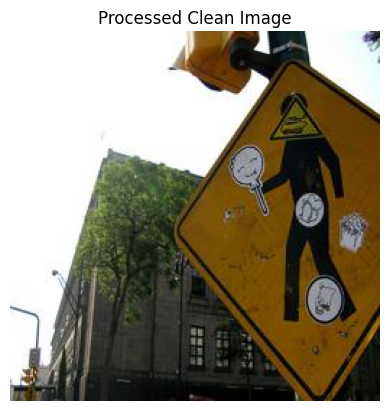

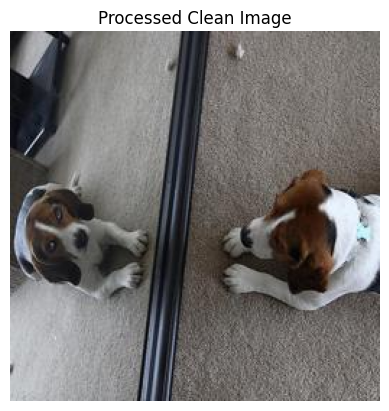

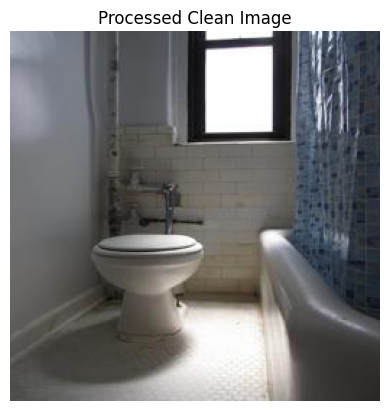

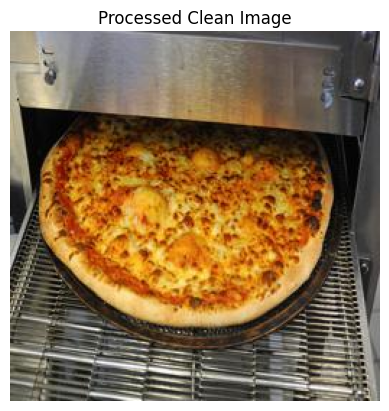

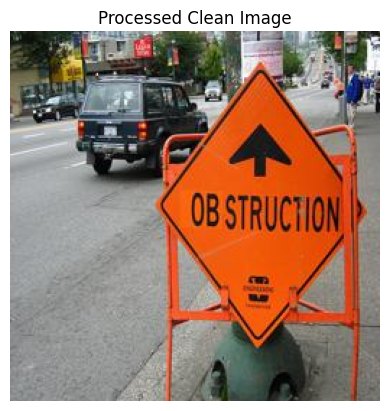

In [ ]:


files = os.listdir(IMG_DIR)
for f in random.sample(files, 5):
    img = Image.open(f"{IMG_DIR}/{f}")
    plt.imshow(img)
    plt.title("Processed Clean Image")
    plt.axis("off")
    plt.show()


In [ ]:


class SegmentationDataset(Dataset):
    def __init__(self, img_dir, mask_dir, ids, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.ids = ids
        self.transform = transform

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        name = self.ids[idx]

        img = np.array(Image.open(f"{self.img_dir}/{name}.jpg").convert("RGB"))
        mask = np.array(Image.open(f"{self.mask_dir}/{name}.png").convert("L"))

        mask = (mask > 127).astype("uint8")  # 0 or 1

        if self.transform:
            aug = self.transform(image=img, mask=mask)
            img = aug["image"].float()
            mask = aug["mask"]

        mask = mask.unsqueeze(0).float()  # (1,H,W)

        return img, mask, name


In [ ]:


all_ids = sorted([os.path.splitext(f)[0] for f in os.listdir(IMG_DIR)])
random.shuffle(all_ids)

split = int(0.8 * len(all_ids))
train_ids = all_ids[:split]
val_ids = all_ids[split:]

print("Train:", len(train_ids), "Val:", len(val_ids))

train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2(),
])

val_tf = A.Compose([
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2(),
])


train_ds = SegmentationDataset(IMG_DIR, BIN_DIR, train_ids, train_tf)
val_ds   = SegmentationDataset(IMG_DIR, BIN_DIR, val_ids, val_tf)

batch_size = 4   # CPU recommended
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=2)



Train: 31684 Val: 7921


In [11]:
!pip install segmentation-models-pytorch --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.5 MB/s eta 0:00:00


In [12]:
import segmentation_models_pytorch as smp
import torch.nn as nn

# Pretrained U-Net (encoder: resnet34)
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,      # WE DO NOT USE pretrained here!
    in_channels=3,
    classes=1
)

# Unfreeze last 2 blocks of encoder
for name, param in model.encoder.named_parameters():
    if "layer4" in name or "layer3" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

# IMPORTANT: ResNet34 decoder outputs 16 channels
model.segmentation_head = nn.Sequential(
    nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(True),
    nn.Conv2d(32, 16, 3, padding=1), nn.ReLU(True),
    nn.Conv2d(16, 1, 1)
)

# Dice Loss (binary, logits)
loss_fn = smp.losses.DiceLoss(mode="binary", from_logits=True)

# Optimizer
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4
)


In [ ]:


from google.colab import drive
drive.mount('/content/drive')

import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import albumentations as A
from albumentations.pytorch import ToTensorV2

device = "cpu"

# -----------------------------
# 1. Define path to model
# -----------------------------
save_dir = "/content/drive/MyDrive/segmentation_checkpoints"
best_model_path = f"{save_dir}/best_model.pth"   # CHANGE if your file name differs

print("Loading model from:", best_model_path)

# -----------------------------
# 2. Recreate model architecture EXACTLY as training
# -----------------------------
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,   # IMPORTANT
    in_channels=3,
    classes=1,
)

# Custom segmentation head (IMPORTANT!)
model.segmentation_head = nn.Sequential(
    nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(True),
    nn.Conv2d(32, 16, 3, padding=1), nn.ReLU(True),
    nn.Conv2d(16, 1, 1)
)

# -----------------------------
# 3. Load the saved weights
# -----------------------------
model.load_state_dict(torch.load(best_model_path, map_location="cpu"))
model.to(device)
model.eval()

print("✅ Model loaded successfully on CPU!")

# -----------------------------
# 4. Inference transform
# -----------------------------
infer_tf = A.Compose([
    A.Normalize(mean=(0.485,0.456,0.406),
                std=(0.229,0.224,0.225)),
    ToTensorV2()
])


Mounted at /content/drive
Loading model from: /content/drive/MyDrive/segmentation_checkpoints/best_model.pth
✅ Model loaded successfully on CPU!


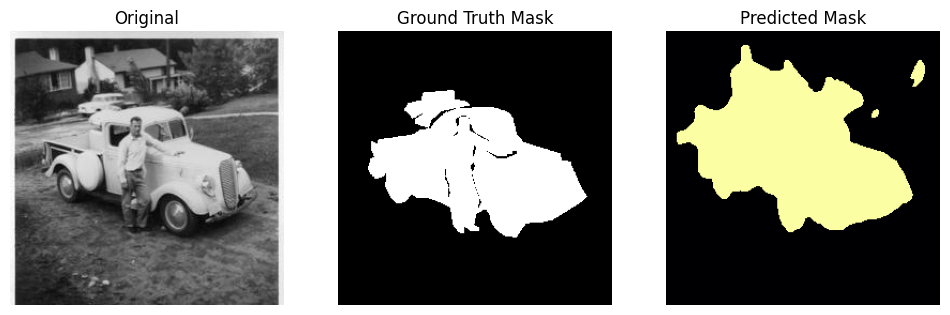

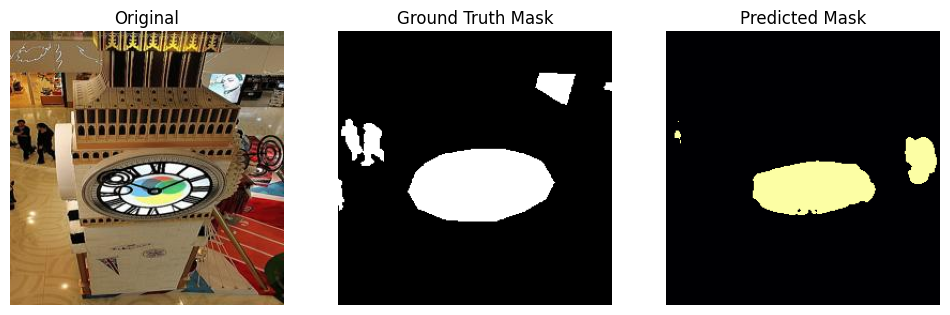

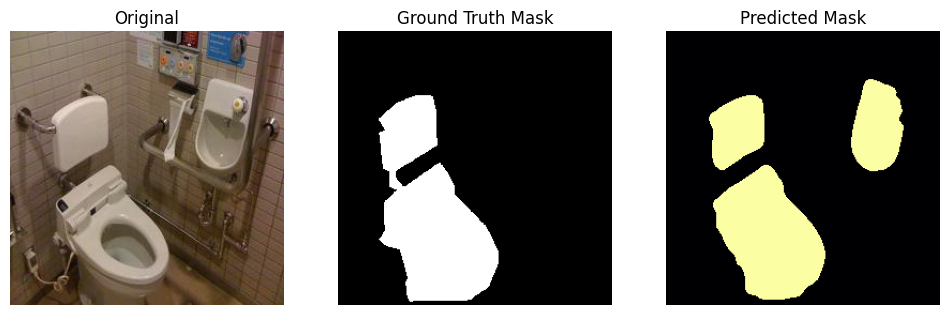

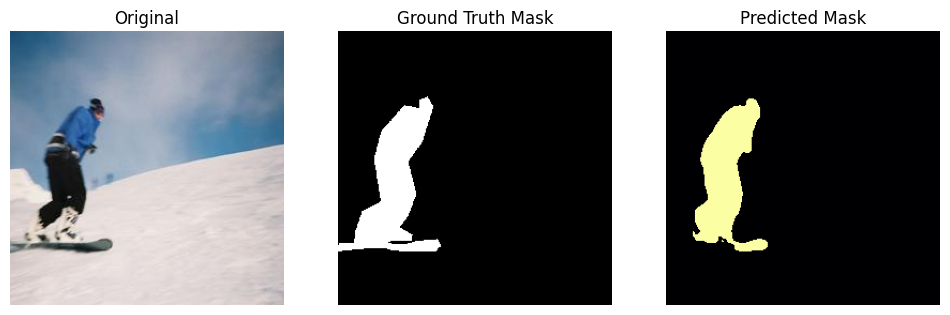

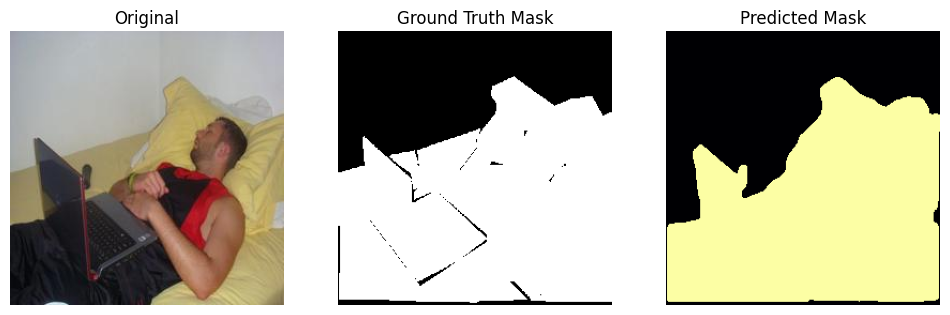

...

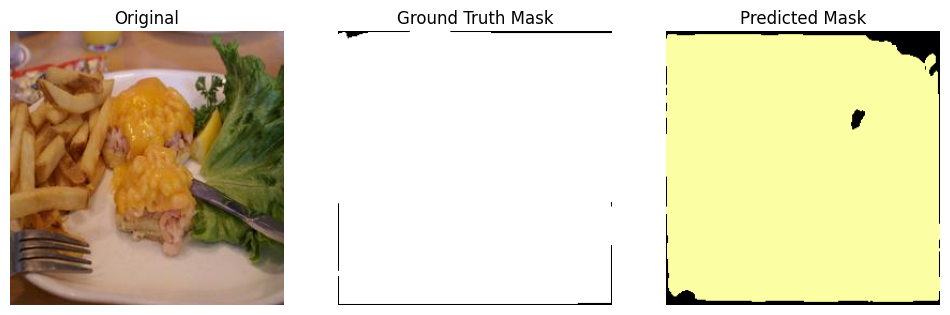

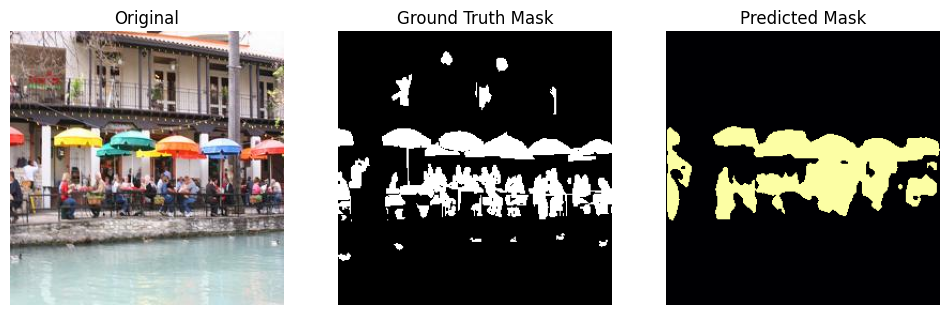

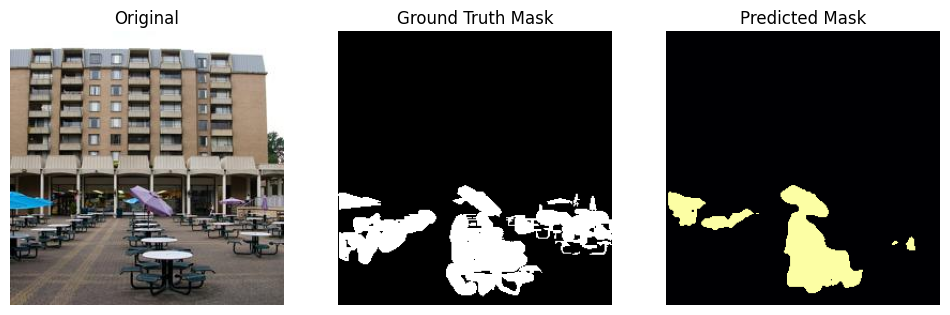

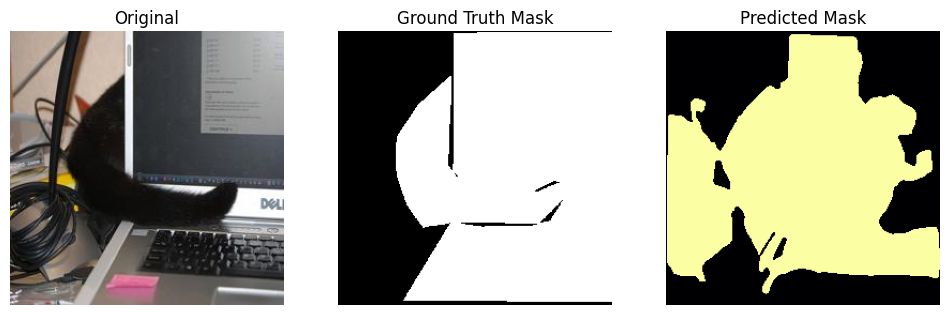

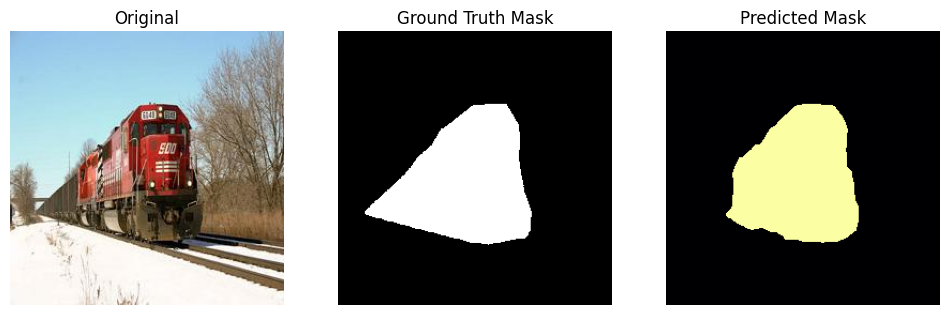

In [19]:
model.eval()

import matplotlib.pyplot as plt
import cv2

samples = random.sample(val_ids, 25)

for name in samples:
    img = np.array(Image.open(f"{IMG_DIR}/{name}.jpg").convert("RGB"))
    mask = np.array(Image.open(f"{MASK_DIR}/{name}.png").convert("L"))

    aug = val_tf(image=img, mask=mask)
    img_t = aug["image"].unsqueeze(0).float().to(device)

    with torch.no_grad():
        pred = torch.sigmoid(model(img_t))[0,0].cpu().numpy()

    pred_bin = (pred > 0.5).astype(np.uint8)

    fig, ax = plt.subplots(1,3, figsize=(12,4))
    ax[0].imshow(img); ax[0].set_title("Original"); ax[0].axis("off")
    ax[1].imshow(mask, cmap="gray"); ax[1].set_title("Ground Truth Mask"); ax[1].axis("off")
    ax[2].imshow(pred_bin, cmap="inferno"); ax[2].set_title("Predicted Mask"); ax[2].axis("off")
    plt.show()


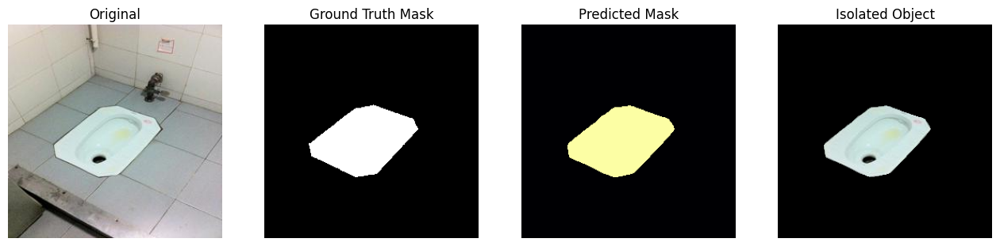

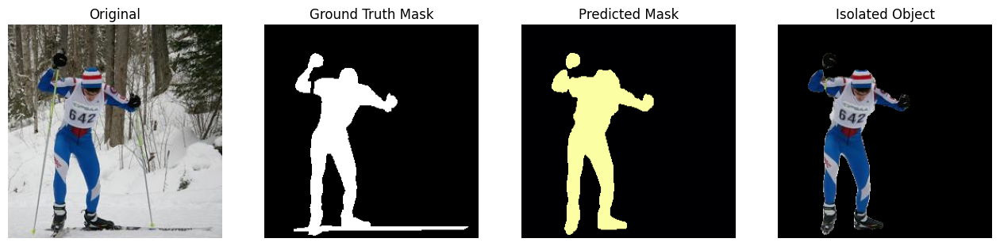

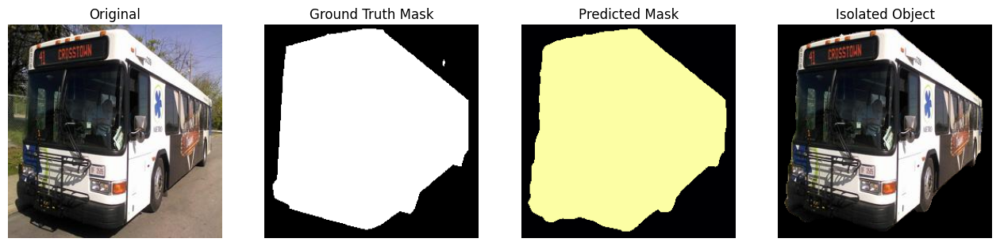

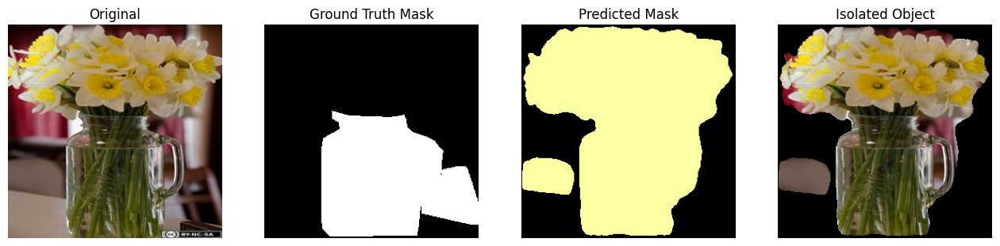

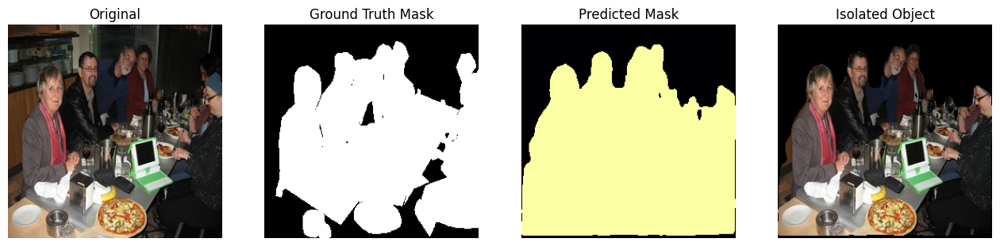

...

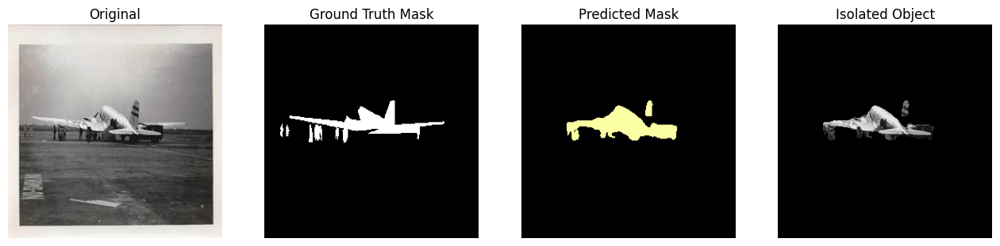

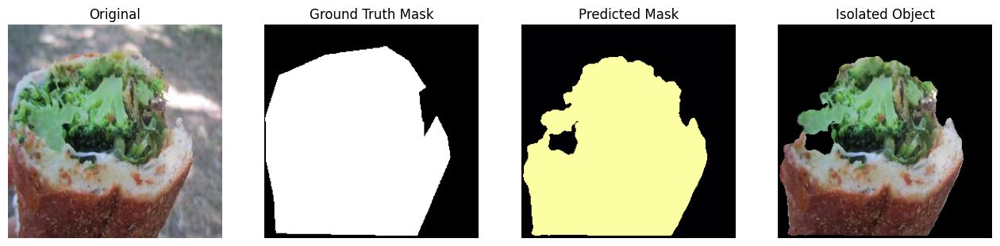

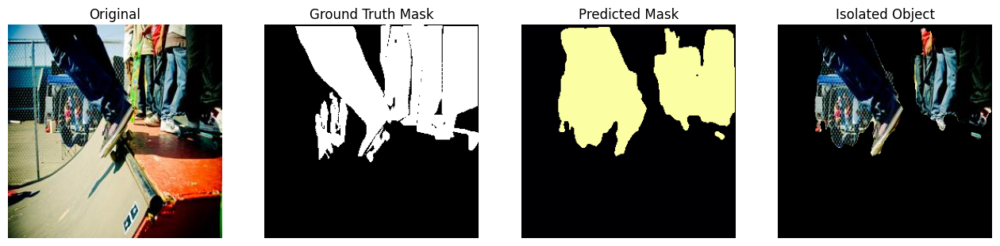

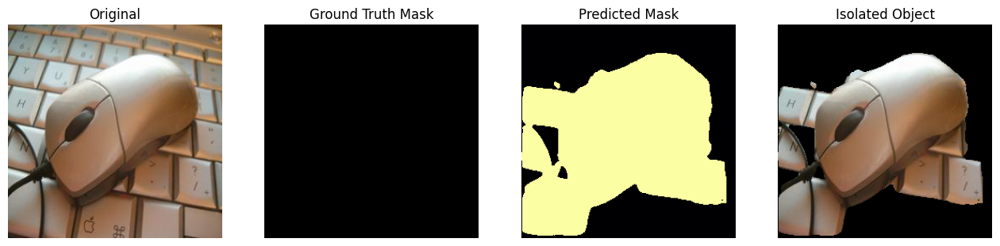

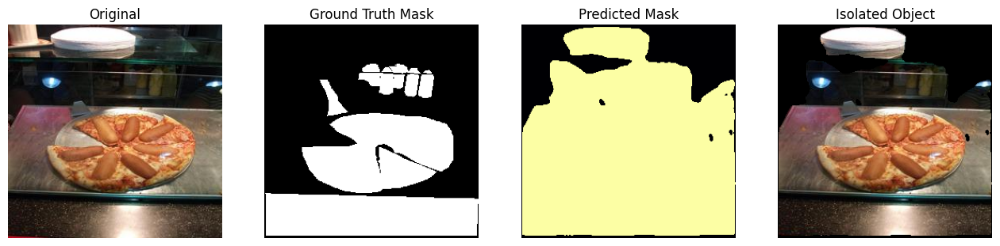

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image

model.eval()

samples = random.sample(val_ids, 25)   # pick random validation images

for name in samples:

    # Load image & mask
    img = np.array(Image.open(f"{IMG_DIR}/{name}.jpg").convert("RGB"))
    mask = np.array(Image.open(f"{MASK_DIR}/{name}.png").convert("L"))

    # Albumentations transform
    aug = infer_tf(image=img, mask=mask)
    img_t = aug["image"].unsqueeze(0).float().to(device)

    # Predict
    with torch.no_grad():
        pred = torch.sigmoid(model(img_t))[0,0].cpu().numpy()

    pred_bin = (pred > 0.5).astype(np.uint8)

    # Resize back to original
    pred_resized = cv2.resize(pred_bin, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Isolate object
    isolated = img * pred_resized[..., None]

    # Plot
    fig, ax = plt.subplots(1,4, figsize=(16,4))

    ax[0].imshow(img)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Ground Truth Mask")
    ax[1].axis("off")

    ax[2].imshow(pred_resized, cmap="inferno")
    ax[2].set_title("Predicted Mask")
    ax[2].axis("off")

    ax[3].imshow(isolated)
    ax[3].set_title("Isolated Object")
    ax[3].axis("off")

    plt.show()


In [14]:
def train_one_epoch(epoch):
    model.train()
    total = 0

    for img, mask, _ in tqdm.tqdm(train_loader, desc=f"Train {epoch}"):
        img, mask = img.to(device), mask.to(device)

        optimizer.zero_grad()
        pred = model(img)
        loss = loss_fn(pred, mask)
        loss.backward()
        optimizer.step()

        total += loss.item()

    return total / len(train_loader)


@torch.no_grad()
def validate(epoch):
    model.eval()
    total = 0
    for img, mask, _ in tqdm.tqdm(val_loader, desc=f"Val {epoch}"):
        img, mask = img.to(device), mask.to(device)
        pred = model(img)
        loss = loss_fn(pred, mask)
        total += loss.item()
    return total / len(val_loader)


# Main training loop
for epoch in range(5):
    tr = train_one_epoch(epoch)
    vl = validate(epoch)
    print(f"Epoch {epoch+1} | Train={tr:.4f} | Val={vl:.4f}")


Val 0: 100%|██████████| 1981/1981 [00:46<00:00, 42.31it/s]


Epoch 1 | Train=0.2929 | Val=0.2418


Val 1: 100%|██████████| 1981/1981 [00:46<00:00, 42.49it/s]


Epoch 2 | Train=0.2602 | Val=0.2432


Val 2: 100%|██████████| 1981/1981 [00:46<00:00, 42.59it/s]


Epoch 3 | Train=0.2545 | Val=0.2348


Val 3: 100%|██████████| 1981/1981 [00:46<00:00, 42.52it/s]


Epoch 4 | Train=0.2449 | Val=0.2312


Val 4: 100%|██████████| 1981/1981 [00:46<00:00, 42.59it/s]

Epoch 5 | Train=0.2422 | Val=0.2312


In [15]:
# ============================================================
# CELL E — SAVE ONLY (NO TRAINING)
# ============================================================

from google.colab import drive
drive.mount('/content/drive')

save_dir = "/content/drive/MyDrive/segmentation_checkpoints"
os.makedirs(save_dir, exist_ok=True)

# Save latest model
torch.save(model.state_dict(), f"{save_dir}/last_epoch.pth")
print("💾 Saved last_epoch.pth")

# Save best model (manually overwrite if needed)
torch.save(model.state_dict(), f"{save_dir}/best_model.pth")
print("🔥 Saved best_model.pth")


Mounted at /content/drive
💾 Saved last_epoch.pth
🔥 Saved best_model.pth


In [ ]:
# ============================================================
# CONTINUE TRAINING (SAFE VERSION)
# ============================================================

from google.colab import drive
drive.mount('/content/drive')

save_dir = "/content/drive/MyDrive/segmentation_checkpoints"
os.makedirs(save_dir, exist_ok=True)

# ------------------------------------------------------------
# 1️⃣ Load the previously best model (resume training)
# ------------------------------------------------------------
best_model_path = f"{save_dir}/best_model.pth"
if os.path.exists(best_model_path):
    print("🔁 Loading previous best model...")
    model.load_state_dict(torch.load(best_model_path))
else:
    print("⚠ No best_model.pth found. Training will continue from current model.")

model.to(device)

# ------------------------------------------------------------
# 2️⃣ Initialize best_loss if not present
# ------------------------------------------------------------
try:
    best_loss
    print(f"Previous best_loss found: {best_loss:.4f}")
except:
    print("Initializing best_loss for continuation...")
    best_loss = float("inf")

# ------------------------------------------------------------
# 3️⃣ Continue training (Epochs 6–15)
# ------------------------------------------------------------
START_EPOCH = 5       # previous training ran epoch 0–4 → so next = 5
END_EPOCH   = 15      # train 10 more epochs

for epoch in range(START_EPOCH, END_EPOCH):

    tr = train_one_epoch(epoch)
    vl = validate(epoch)

    print(f"Epoch {epoch+1} | Train={tr:.4f} | Val={vl:.4f}")

    # Save last epoch
    torch.save(model.state_dict(), f"{save_dir}/last_epoch.pth")

    # Save best model
    if vl < best_loss:
        best_loss = vl
        torch.save(model.state_dict(), f"{save_dir}/best_model.pth")
        print("🔥 Improved model saved as BEST!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🔁 Loading previous best model...
Initializing best_loss for continuation...


Val 5: 100%|██████████| 1981/1981 [00:48<00:00, 41.10it/s]


Epoch 6 | Train=0.2366 | Val=0.2279
🔥 Improved model saved as BEST!


Val 6: 100%|██████████| 1981/1981 [00:47<00:00, 42.07it/s]


Epoch 7 | Train=0.2334 | Val=0.2285


Val 7: 100%|██████████| 1981/1981 [00:47<00:00, 41.78it/s]


Epoch 8 | Train=0.2316 | Val=0.2228
🔥 Improved model saved as BEST!


Val 8: 100%|██████████| 1981/1981 [00:47<00:00, 41.67it/s]


Epoch 9 | Train=0.2266 | Val=0.2219
🔥 Improved model saved as BEST!


Val 9: 100%|██████████| 1981/1981 [00:47<00:00, 41.94it/s]


Epoch 10 | Train=0.2237 | Val=0.2180
🔥 Improved model saved as BEST!


Val 10: 100%|██████████| 1981/1981 [00:47<00:00, 41.73it/s]


Epoch 11 | Train=0.2228 | Val=0.2181


Val 11: 100%|██████████| 1981/1981 [00:47<00:00, 41.41it/s]


Epoch 12 | Train=0.2196 | Val=0.2182


Train 12:  91%|█████████ | 7209/7921 [08:11<00:58, 12.17it/s]